# Description

Sandbox notebook for metalearning IVs.

# Imports

In [57]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import numpy as np
import pandas as pd
import seaborn as sns

from ipywidgets import interact_manual, IntSlider, FloatSlider
from sklearn.linear_model import LinearRegression
from linearmodels.iv.model import IV2SLS

%matplotlib inline

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

from tqdm import tqdm

In [159]:
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error as mse
from sklearn.linear_model import LinearRegression


# Functions

In [2]:
iv_columns = ['instrument', 'treatment', 'confounder', 'outcome']

def generate_iv_data(n_samples, treat_effect, confound_effect, I_T, C_T, seed=42, exclusion_effect=0):
    """
    Generates IV data from a multivariate Gaussian.
    
    n_samples (int): the number samples to generate
    treat_effect (float): the true effect (coefficient) of the treatment on outcome
    confound_effect (float): the effect of the confounder (coefficient) on the outcome
    I_T (float): instrument strength, the covariance between the instrument and treatment
    C_T (float): confound strength, the covariance between the confound and treatment
    seed (int): optionally set random seed, for reproducibility
    exclusion_effect (float): optionally set the effect of the instrument on the outcome, violating the exclusion restriction
    """
    
    idx_dict = {
        'I': 0,
        'T': 1,
        'C': 2,
        'O': 3
    }

    # vars:             I    T    C
    covar = np.array([[1.0, I_T, 0.0], # I
                      [I_T, 1.0, C_T], # T
                      [0.0, C_T, 1.0]])# C
    covar += np.eye(3,3)
    # vars:  I  T  C
    means = [0, 0, 0]

    # generate some data
    np.random.seed(seed)
    data = np.random.multivariate_normal(mean=means, cov=covar, size=n_samples)

    O = (confound_effect*data[:, idx_dict['C']]) \
        + (treat_effect*(data[:, idx_dict['T']])) \
        + (exclusion_effect*data[:, idx_dict['I']]) \
        + np.random.normal(0,1,size=n_samples)

    data = np.concatenate([data,O.reshape(-1, 1)], axis=1)

    data_df = pd.DataFrame(data, columns=iv_columns)
    
    return data_df

In [114]:
treat_effect = 2
confound_effect = 1
n_samples = 1000
I_T = 0.9 # instrument strength
C_T = 0.1 # confound strength
data_df = generate_iv_data(n_samples, treat_effect, confound_effect, I_T, C_T)

In [115]:
data = data_df.drop('confounder', axis='columns')   

print(np.cov(data, rowvar=False))

cov_mat = np.cov(data, rowvar=False)

var = np.diag(cov_mat).reshape(-1)
var = var[var != 0]


cov = np.triu(cov_mat, k=1).reshape(-1)
cov = cov[cov != 0]
mean = np.mean(data).values

print(mean)
print(var)
print(cov)

[[ 1.95681883  0.84026965  1.50362365]
 [ 0.84026965  1.85807083  3.77335624]
 [ 1.50362365  3.77335624 10.79514951]]
[-0.03230563 -0.10104398 -0.21590394]
[ 1.95681883  1.85807083 10.79514951]
[0.84026965 1.50362365 3.77335624]


In [126]:
generate_iv_features(data_df, 10)

array([-0.03230563, -0.10104398, -0.21590394,  1.95681883,  1.85807083,
       10.79514951,  0.84026965,  1.50362365,  3.77335624, 10.        ])

In [116]:
data.head()

,instrument,treatment,outcome
0,-0.140428,-1.077822,-3.882316
1,-2.033206,-1.662518,-4.078153
2,-2.117114,-1.556145,-4.853126
3,-1.064743,-0.309429,1.809930
4,-1.856864,0.984370,5.041412


In [61]:
def generate_iv_features(data_df, n):
    """Generates IV features from a given data matrix."""
    
    data = data_df.drop('confounder', axis='columns')   
    
    cov_mat = np.cov(data, rowvar=False)

    var = np.diag(cov_mat).reshape(-1)
    var = var[var != 0]
    

    cov = np.triu(cov_mat, k=1).reshape(-1)
    cov = cov[cov != 0]
    mean = np.mean(data).values

    #print(mean)
    #print(var)
    #print(cov)

    return np.concatenate([mean, var, cov, np.array(n).reshape(-1)])

In [62]:
generate_iv_features(data_df, n_samples)

array([8.48499192e-03, 5.05197603e-03, 3.55878697e-03, 2.03462860e+00,
       1.96649852e+00, 9.52460049e+00, 5.22891643e-01, 8.49538218e-01,
       3.61202270e+00, 1.00000000e+04])

In [170]:
test_size = 2000

lin_reg_taus = np.zeros(test_size)
tsls_taus = np.zeros(test_size)
test_taus = np.zeros(test_size)

I_T = 0.9 # instrument strength
C_T = 0.9 # confound strength

for i in tqdm(range(test_size)):
    np.random.seed(i)
    treat_effect = np.random.uniform(-5, 5)
    confound_effect = np.random.uniform(1, 5)

    data_df = generate_iv_data(size, treat_effect, confound_effect, I_T, C_T, seed=i)

    lin_reg = LinearRegression()
    
    lin_reg.fit(data_df['treatment'].values.reshape(-1,1), data_df['outcome'])
    
    tsls = IV2SLS.from_formula('outcome ~ 1 + [treatment ~ instrument]',
                               data=data_df)    
    iv_res = tsls.fit()
    #print(iv_res.params['treatment'])    
    #print(lin_reg.coef_[0])
    #print(treat_effect)

    lin_reg_taus[i] = lin_reg.coef_[0]
    tsls_taus[i] = iv_res.params['treatment']
    test_taus[i] = treat_effect

100%|██████████| 2000/2000 [00:28<00:00, 71.43it/s]


In [171]:
mse(tsls_taus, test_taus)

0.05729299846569729

In [172]:
mse(lin_reg_taus, test_taus)

2.069181979320487

In [174]:
n_samples = 10000
size = 1000

data = np.zeros((n_samples, 10))
taus = np.zeros(n_samples)
confounds = np.zeros(n_samples)
I_T = 0.9 # instrument strength
C_T = 0.9 # confound strength

for i in tqdm(range(n_samples)):
    np.random.seed(i)
    treat_effect = np.random.uniform(-5, 5)
    confound_effect = np.random.uniform(1, 5)

    data_df = generate_iv_data(size, treat_effect, confound_effect, I_T, C_T, seed=i)

    feats = generate_iv_features(data_df, size)
    data[i,:] = feats
    taus[i] = treat_effect
    confounds[i] = confound_effect

100%|██████████| 10000/10000 [00:20<00:00, 493.69it/s]


In [175]:
from sklearn.model_selection import train_test_split

X_train = data[test_size:, :]
X_test = data[:test_size:, :]

y_train = taus[test_size:]
y_test = taus[:test_size]


#X_test, y_train, y_test = train_test_split(data, taus, test_size=0.2, random_state=42)

In [176]:
X_train.shape

(8000, 10)

In [184]:
meta_learner = MLPRegressor(hidden_layer_sizes=(128, 128), 
                            activation='relu',
                            random_state=42)

In [185]:
%%time
meta_learner.fit(X_train, y_train)

CPU times: user 8min 57s, sys: 12min, total: 20min 57s
Wall time: 1min 17s


MLPRegressor(hidden_layer_sizes=(128, 128), random_state=42)

In [186]:
preds = meta_learner.predict(X_test)

mse(preds, y_test)

0.05327749752793158

In [180]:

lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

LinearRegression()

In [181]:
lin_reg.coef_

array([ 0.13941838,  0.03536899,  0.00700146,  0.60022583, -0.17972472,
       -0.00347733, -1.36134334,  0.8225632 ,  0.13495153,  0.        ])

In [182]:
lin_reg.score(X_test, y_test)

0.9907058618123395

In [183]:
preds = lin_reg.predict(X_test)

mse(preds, y_test)

0.07878219553735764

Text(0.5, 0, 'Cov(T,Z)')

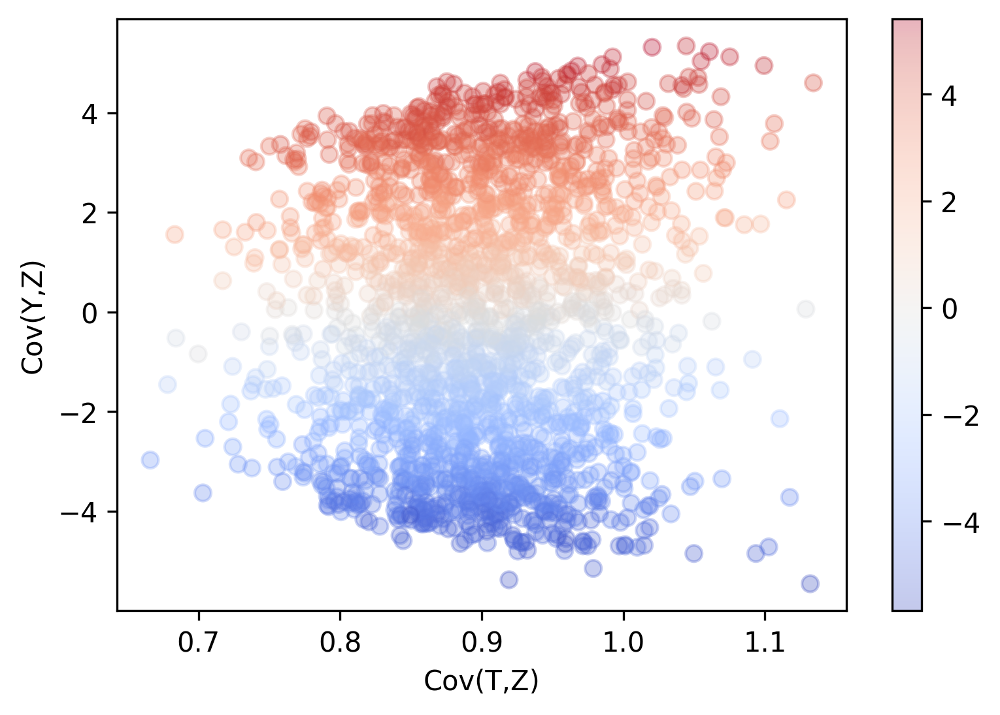

In [188]:
# plot heatmap scatter plot
sc = plt.scatter(x=X_test[:,6], y=X_test[:, 7], c=preds, cmap='coolwarm', alpha=0.3)
plt.colorbar(sc)
plt.ylabel("Cov(Y,Z)")
plt.xlabel("Cov(T,Z)")

Text(0.5, 0, 'Cov(T,Z)')

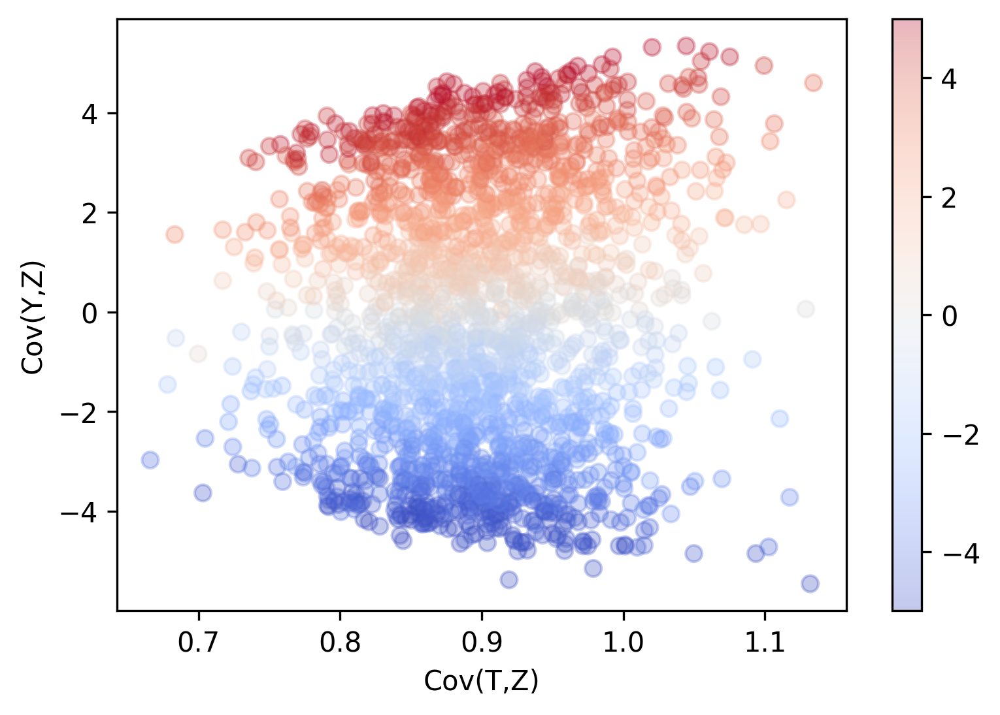

In [189]:
# plot heatmap scatter plot
sc = plt.scatter(x=X_test[:,6], y=X_test[:, 7], c=y_test, cmap='coolwarm', alpha=0.3)
plt.colorbar(sc)
plt.ylabel("Cov(Y,Z)")
plt.xlabel("Cov(T,Z)")

In [141]:
pd.Series(preds).describe()

count    10000.000000
mean        -0.041137
std          2.871214
min         -6.132689
25%         -2.454975
50%          0.073837
75%          2.466662
max          5.417494
dtype: float64

Text(0.5, 0, 'x')

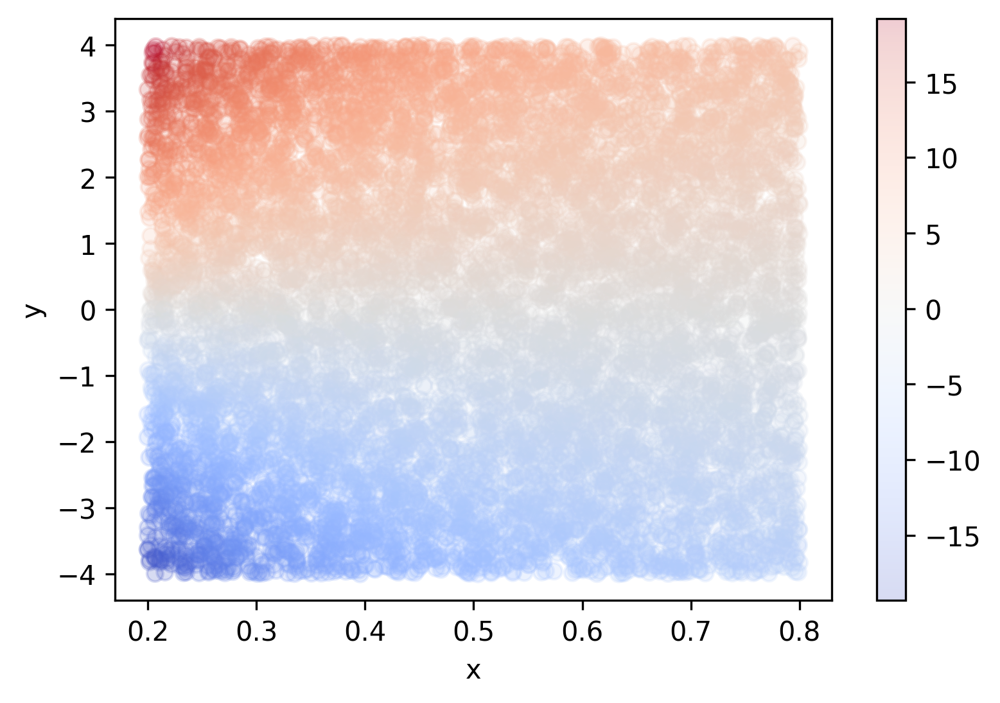

In [143]:
# plot y/x as a heatmap
x = np.random.uniform(0.2, 0.8, size=10000)
y = np.random.uniform(-4, 4, size=10000)
z = y / x

sc = plt.scatter(x=x, y=y, c=z, cmap='coolwarm', alpha=0.2)
plt.colorbar(sc)
plt.ylabel("y")
plt.xlabel("x")

# Full simulations: varying IV strength

In [ ]:
# def sim_iv_linreg(iv_strs, n_samples, size, I_T, C_T):
#     """
    
#     n_samples (int): the number of dataset samples to generate
#     size (int): the size of each dataset
#     I_T (float
#     """

In [255]:
iv_strs = np.round(np.linspace(0.1, 0.9, 9), 2)
C_T = 0.9 # confound strength
n_samples = 10000 # number of dataset samples to generate
test_samples = 2000
size = 1000 # the size of each dataset

iv_mses = []#np.zeros_like(iv_strs)
reg_mses = []#np.zeroes_like(iv_strs)

iv_preds = []
reg_preds = []
    
for I_T in tqdm(iv_strs):
    lin_reg_taus = np.zeros(test_samples)
    tsls_taus = np.zeros(test_samples)
    test_taus = np.zeros(test_samples)

    for i in range(test_samples):
        np.random.seed(i)
        treat_effect = np.random.uniform(-5, 5)
        confound_effect = np.random.uniform(1, 5)

        data_df = generate_iv_data(size, treat_effect, confound_effect, I_T, C_T, seed=i+int(I_T*10))

        lin_reg = LinearRegression()

        lin_reg.fit(data_df['treatment'].values.reshape(-1,1), data_df['outcome'])

        tsls = IV2SLS.from_formula('outcome ~ 1 + [treatment ~ instrument]',
                                   data=data_df)    
        iv_res = tsls.fit()
        
        lin_reg_taus[i] = lin_reg.coef_[0]
        tsls_taus[i] = iv_res.params['treatment']
        test_taus[i] = treat_effect
        
    iv_preds.append(tsls_taus)
    reg_preds.append(lin_reg_taus)
        
    iv_mses.append(mse(tsls_taus, test_taus))
    reg_mses.append(mse(lin_reg_taus, test_taus))

100%|██████████| 9/9 [03:05<00:00, 20.58s/it]


In [211]:
# metalearning

ml_mses = []

ml_preds = []
test_taus = []
test_feats = []

for I_T in tqdm(iv_strs):
    for i in range(n_samples):
        np.random.seed(i)
        treat_effect = np.random.uniform(-5, 5)
        confound_effect = np.random.uniform(1, 5)

        data_df = generate_iv_data(size, treat_effect, confound_effect, I_T, C_T, seed=i)

        feats = generate_iv_features(data_df, size)
        data[i,:] = feats
        taus[i] = treat_effect
        confounds[i] = confound_effect
        
    X_train = data[test_samples:, :]
    X_test = data[:test_samples:, :]

    y_train = taus[test_samples:]
    y_test = taus[:test_samples]
    
    meta_learner = MLPRegressor(hidden_layer_sizes=(128, 128), 
                            activation='relu',
                            random_state=42)
    
    meta_learner.fit(X_train, y_train)
    
    preds = meta_learner.predict(X_test)
    ml_preds.append(preds)
    test_taus.append(y_test)
    test_feats.append(X_test)
    
    ml_mses.append(mse(preds, y_test))

100%|██████████| 9/9 [11:01<00:00, 73.54s/it]


In [231]:
# regen test_taus temporarily
test_taus = []

for I_T in tqdm(iv_strs):
    for i in range(n_samples):
        np.random.seed(i)
        treat_effect = np.random.uniform(-5, 5)
        confound_effect = np.random.uniform(1, 5)

        data_df = generate_iv_data(size, treat_effect, confound_effect, I_T, C_T, seed=i)

        feats = generate_iv_features(data_df, size)
        data[i,:] = feats
        taus[i] = treat_effect
        confounds[i] = confound_effect
        
    X_train = data[test_samples:, :]
    X_test = data[:test_samples:, :]

    y_train = taus[test_samples:]
    y_test = taus[:test_samples]
    test_taus.append(y_test)


100%|██████████| 9/9 [02:18<00:00, 15.41s/it]


In [234]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [251]:
iv_strs[4]

0.5

(4, 3)


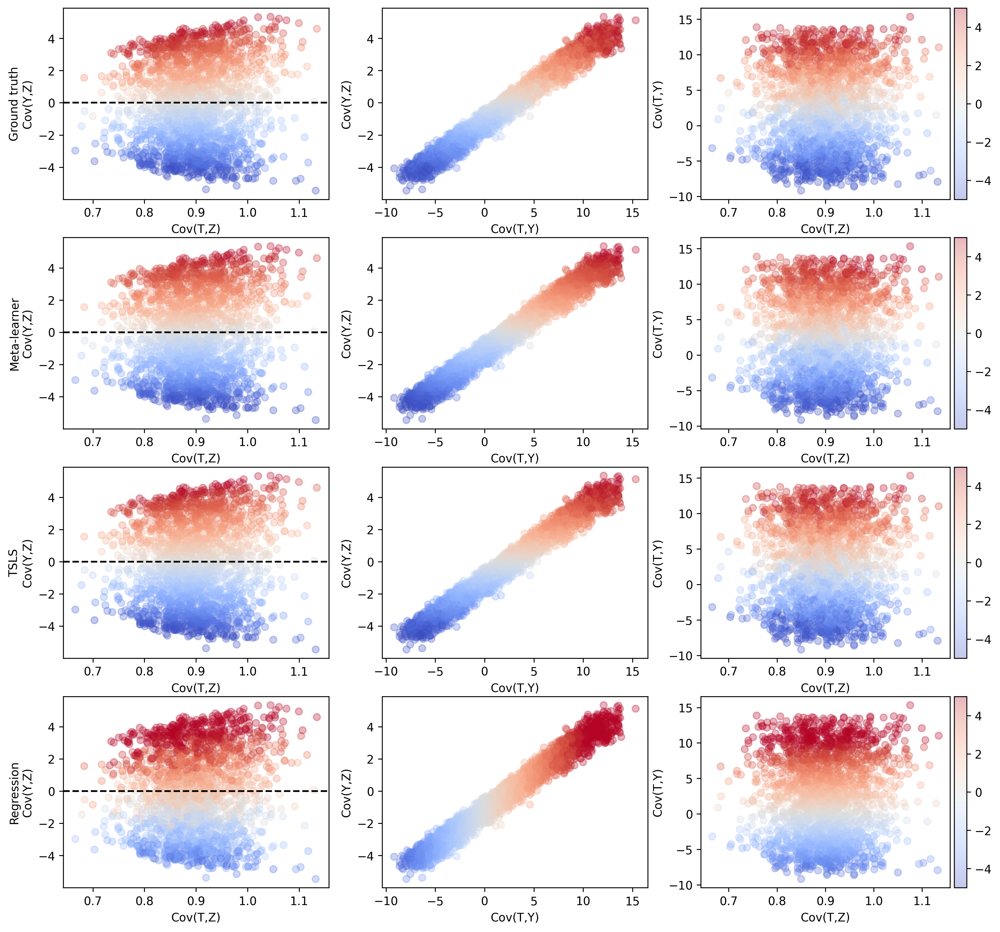

In [253]:
fig, axs = plt.subplots(4, 3, figsize=(14, 14), dpi=300)
fig.patch.set_color("white")
print(axs.shape)

COV_TY = 8
COV_YZ = 7
COV_TZ = 6

idx = -1

X_test = test_feats[idx]

# ground truth
ax1, ax2, ax3 = axs[0]
y = test_taus[idx]
sc = ax1.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax1.set_xlabel("Cov(T,Z)")
ax1.set_ylabel("Ground truth\nCov(Y,Z)")
sc = ax2.scatter(x=X_test[:,COV_TY], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax2.set_xlabel("Cov(T,Y)")
ax2.set_ylabel("Cov(Y,Z)")
sc = ax3.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_TY], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax3.set_xlabel("Cov(T,Z)")
ax3.set_ylabel("Cov(T,Y)")
ax1.axhline(y=0, ls='--', color='black')

divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(sc, cax=cax, orientation='vertical')

# ml
ax1, ax2, ax3 = axs[1]
y = ml_preds[idx]
sc = ax1.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax1.set_xlabel("Cov(T,Z)")
ax1.set_ylabel("Meta-learner\nCov(Y,Z)")
sc = ax2.scatter(x=X_test[:,COV_TY], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax2.set_xlabel("Cov(T,Y)")
ax2.set_ylabel("Cov(Y,Z)")
sc = ax3.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_TY], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax3.set_xlabel("Cov(T,Z)")
ax3.set_ylabel("Cov(T,Y)")
ax1.axhline(y=0, ls='--', color='black')

divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(sc, cax=cax, orientation='vertical')

# tsls
ax1, ax2, ax3 = axs[2]
y = iv_preds[idx]
sc = ax1.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax1.set_xlabel("Cov(T,Z)")
ax1.set_ylabel("TSLS\nCov(Y,Z)")
sc = ax2.scatter(x=X_test[:,COV_TY], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax2.set_xlabel("Cov(T,Y)")
ax2.set_ylabel("Cov(Y,Z)")
sc = ax3.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_TY], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax3.set_xlabel("Cov(T,Z)")
ax3.set_ylabel("Cov(T,Y)")
ax1.axhline(y=0, ls='--', color='black')

divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(sc, cax=cax, orientation='vertical')

# reg
ax1, ax2, ax3 = axs[3]
y = reg_preds[idx]
sc = ax1.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax1.set_xlabel("Cov(T,Z)")
ax1.set_ylabel("Regression\nCov(Y,Z)")
sc = ax2.scatter(x=X_test[:,COV_TY], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax2.set_xlabel("Cov(T,Y)")
ax2.set_ylabel("Cov(Y,Z)")
sc = ax3.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_TY], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax3.set_xlabel("Cov(T,Z)")
ax3.set_ylabel("Cov(T,Y)")

ax1.axhline(y=0, ls='--', color='black')
divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(sc, cax=cax, orientation='vertical')




In [212]:
ml_mses

[0.19827030280279742,
 0.18803920847258507,
 0.17982610958661452,
 0.17343452186320674,
 0.16250248696487898,
 0.07747846305565899,
 0.06252387784701516,
 0.10946960099804648,
 0.05327749752793158]

In [200]:
iv_mses

[1748.7825767626255,
 3.737827294024023,
 0.6293993509475219,
 0.31619743468512906,
 0.19435730125674291,
 0.13241038944925443,
 0.09617590497970502,
 0.07302243112901798,
 0.05729299846569729]

In [201]:
reg_mses

[2.0659029640551445,
 2.066531523419837,
 2.0671172158668,
 2.067643477107523,
 2.068099736442619,
 2.068481100847099,
 2.068787007892993,
 2.069019555717633,
 2.069181979320487]

Text(0.5, 1.0, 'MSE for n=1000, confounded treatment, 10k datasets')

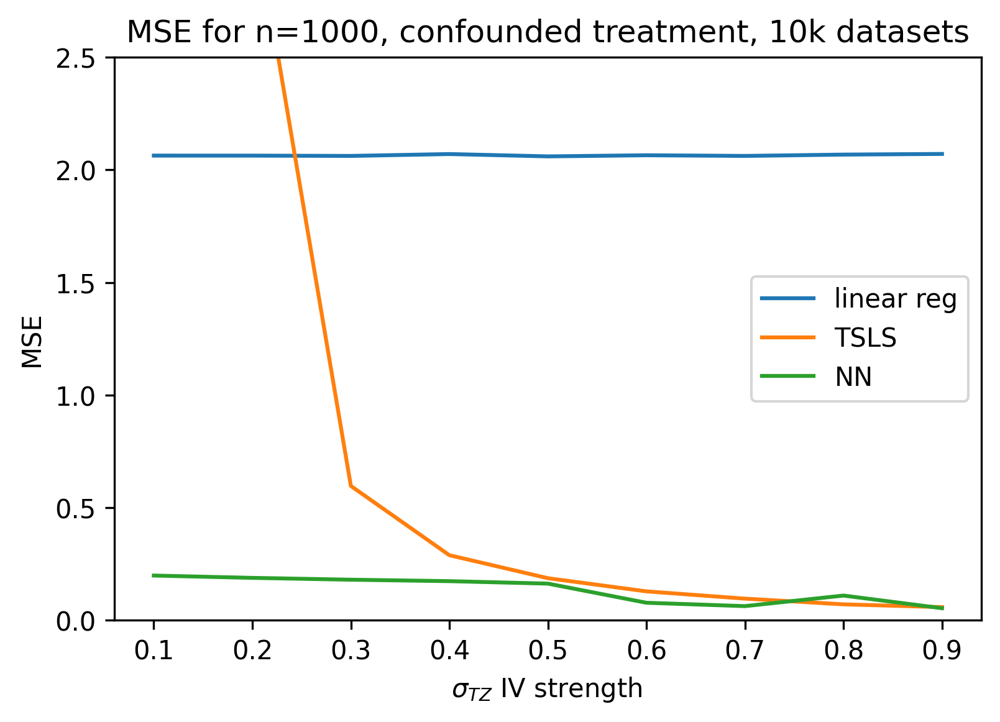

In [257]:
fig, ax = plt.subplots(dpi=300)
fig.patch.set_color("white")

ax.plot(iv_strs, reg_mses, label="linear reg")
ax.plot(iv_strs, iv_mses, label="TSLS")
ax.plot(iv_strs, ml_mses, label="NN")
ax.legend()
ax.set_ylim(0, 2.5)
ax.set_ylabel("MSE")
ax.set_xlabel("$\sigma_{TZ}$ IV strength ")
ax.set_title("MSE for n=1000, confounded treatment, 10k datasets")

# Full simulations: varying confounder strength

In [ ]:
# def sim_iv_linreg(iv_strs, n_samples, size, I_T, C_T):
#     """
    
#     n_samples (int): the number of dataset samples to generate
#     size (int): the size of each dataset
#     I_T (float
#     """

In [258]:
confound_strs = np.round(np.linspace(0.1, 0.9, 9), 2)
I_T = 0.5 # instrument strength
n_samples = 10000 # number of dataset samples to generate
test_samples = 2000
size = 1000 # the size of each dataset

iv_mses = []#np.zeros_like(confound_strs)
reg_mses = []#np.zeroes_like(confound_strs)

iv_preds = []
reg_preds = []
    
for C_T in tqdm(confound_strs):
    lin_reg_taus = np.zeros(test_samples)
    tsls_taus = np.zeros(test_samples)
    test_taus = np.zeros(test_samples)

    for i in range(test_samples):
        np.random.seed(i)
        treat_effect = np.random.uniform(-5, 5)
        confound_effect = np.random.uniform(1, 5)

        data_df = generate_iv_data(size, treat_effect, confound_effect, I_T, C_T, seed=i+int(C_T*10))

        lin_reg = LinearRegression()

        lin_reg.fit(data_df['treatment'].values.reshape(-1,1), data_df['outcome'])

        tsls = IV2SLS.from_formula('outcome ~ 1 + [treatment ~ instrument]',
                                   data=data_df)    
        iv_res = tsls.fit()
        
        lin_reg_taus[i] = lin_reg.coef_[0]
        tsls_taus[i] = iv_res.params['treatment']
        test_taus[i] = treat_effect
        
    iv_preds.append(tsls_taus)
    reg_preds.append(lin_reg_taus)
        
    iv_mses.append(mse(tsls_taus, test_taus))
    reg_mses.append(mse(lin_reg_taus, test_taus))

100%|██████████| 9/9 [03:04<00:00, 20.52s/it]


In [266]:
n_samples

10000

In [267]:
# metalearning

ml_mses = []

ml_preds = []
test_taus = []
test_feats = []

for C_T in tqdm(confound_strs):
    for i in range(n_samples):
        np.random.seed(i+int(C_T*10))
        treat_effect = np.random.uniform(-5, 5)
        confound_effect = np.random.uniform(1, 5)

        data_df = generate_iv_data(size, treat_effect, confound_effect, I_T, C_T, seed=i+int(C_T*10))

        feats = generate_iv_features(data_df, size)
        data[i,:] = feats
        taus[i] = treat_effect
        confounds[i] = confound_effect
        
    X_train = data[test_samples:, :]
    X_test = data[:test_samples:, :]

    y_train = taus[test_samples:]
    y_test = taus[:test_samples]
    
    meta_learner = MLPRegressor(hidden_layer_sizes=(128, 128), 
                            activation='relu',
                            random_state=42)
    
    meta_learner.fit(X_train, y_train)
    
    preds = meta_learner.predict(X_test)
    ml_preds.append(preds)
    test_taus.append(y_test)
    test_feats.append(X_test)
    
    ml_mses.append(mse(preds, y_test))

100%|██████████| 9/9 [12:25<00:00, 82.88s/it] 


In [269]:
ml_mses

[0.03103974734088111,
 0.030159544797050103,
 0.031036592396327164,
 0.034595572356987236,
 0.057666933618528586,
 0.08375883748330258,
 0.052217345283188325,
 0.050022132653636,
 0.07988038843251383]

Text(0.5, 1.0, 'MSE for n=1000, confounded treatment, 10k datasets')

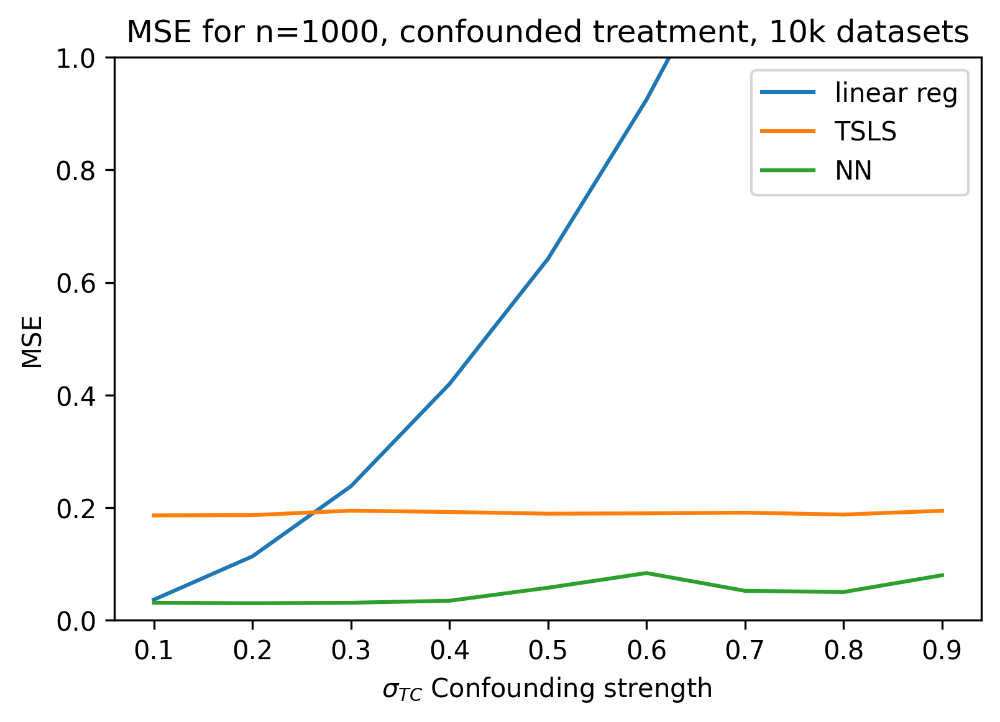

In [270]:
fig, ax = plt.subplots(dpi=300)
fig.patch.set_color("white")

ax.plot(confound_strs, reg_mses, label="linear reg")
ax.plot(confound_strs, iv_mses, label="TSLS")
ax.plot(confound_strs, ml_mses, label="NN")
ax.legend()
ax.set_ylim(0, 1)
ax.set_ylabel("MSE")
ax.set_xlabel("$\sigma_{TC}$ Confounding strength ")
ax.set_title("MSE for n=1000, confounded treatment, 10k datasets")

# TODOs

- ~~can also run OLS, 2SLS on the non-featurized datasets, record their estimated taus, and compute those MSEs~~
- need to re-run experiments with binarized treatment and instruments